# **Anomlay Detection using Neural Network**

In [89]:
# Important libraries /packages:

import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
from PIL import Image
import random

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torchvision import transforms

import torch.nn.functional as F
from torchvision import models
from torchvision.transforms import transforms
import torch.nn.utils.prune as prune

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score


In [2]:
# Mounting Google drive for accessing the dataset
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive




---

**Parameters**

---



In [90]:

# Path to the subdataset of any specific class objects
data_folder = "/content/gdrive/MyDrive/AI_engr_task/Anomaly_Detection_using_NN"
subset_name = "leather"
data_folder = os.path.join(data_folder, subset_name)

# Declaring the constants:

GOOD_CLASS_FOLDER = "good"
DATASET_SETS = ["train", "test"]
IMG_FORMAT = ".png"
INPUT_IMG_SIZE = (224, 224)
NEG_CLASS = 1

batch_size = 32
target_train_accuracy = 0.99
lr = 0.0001
epochs = 20
class_weight = [1, 3] if NEG_CLASS == 1 else [3, 1]
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
heatmap_thres = 0.7



In [91]:
print(data_folder)

/content/gdrive/MyDrive/AI_engr_task/Anomaly_Detection_using_NN/leather


### Dataset Retreval:

Here we will load a subset of the dataset such as Dataset/Capsule and will train the model based of this subset of dataset to evaluate the model performance.

In [92]:
class MVTEC_AD_DATASET(Dataset):
    """
    Class to load subsets of MVTEC ANOMALY DETECTION DATASET
    Dataset Link: https://www.mvtec.com/company/research/datasets/mvtec-ad

    Root is path to the subset, for instance, `mvtec_anomaly_detection/leather`
    """

    def __init__(self, root):
        self.classes = ["Good", "Anomaly"] if NEG_CLASS == 1 else ["Anomaly", "Good"]

        self.img_transform = transforms.Compose([
            transforms.Resize(INPUT_IMG_SIZE),
            transforms.RandomHorizontalFlip(),  # Apply horizontal flip randomly
            transforms.RandomVerticalFlip(),  # Apply vertical flip randomly
            transforms.ToTensor()
        ])

        (self.img_filenames, self.img_labels, self.img_labels_detailed,) = self._get_images_and_labels(root)

    def _get_images_and_labels(self, root):
        image_names = []
        labels = []
        labels_detailed = []

        for folder in DATASET_SETS:
            folder = os.path.join(root, folder)

            for class_folder in os.listdir(folder):
                label = (1 - NEG_CLASS if class_folder == GOOD_CLASS_FOLDER else NEG_CLASS)
                label_detailed = class_folder

                class_folder = os.path.join(folder, class_folder)
                class_images = os.listdir(class_folder)
                class_images = [os.path.join(class_folder, image) for image in class_images if image.find(IMG_FORMAT) > -1]

                image_names.extend(class_images)
                labels.extend([label] * len(class_images))
                labels_detailed.extend([label_detailed] * len(class_images))

        print("Dataset {}: N Images = {}, Share of anomalies = {:.3f}".format(root, len(labels), np.sum(labels) / len(labels)))

        return image_names, labels, labels_detailed

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_fn = self.img_filenames[idx]
        label = self.img_labels[idx]
        img = Image.open(img_fn)
        img = self.img_transform(img)
        label = torch.as_tensor(label, dtype=torch.long)
        return img, label

def get_train_test_loaders(root, batch_size, test_size=0.2, random_state=42):
    """
    Returns train and test dataloaders.
    Splits dataset in stratified manner, considering various defect types.
    """
    dataset = MVTEC_AD_DATASET(root=root)

    train_idx, test_idx = train_test_split(np.arange(dataset.__len__()),test_size=test_size,shuffle=True,
                                            stratify=dataset.img_labels_detailed,random_state=random_state,)
    train_sampler = SubsetRandomSampler(train_idx)
    test_sampler = SubsetRandomSampler(test_idx)

    train_loader = DataLoader(dataset, batch_size=batch_size, sampler=train_sampler, drop_last=True)
    test_loader = DataLoader(dataset, batch_size=batch_size, sampler=test_sampler, drop_last=False)

    return train_loader, test_loader



In [93]:
train_loader, test_loader = get_train_test_loaders(
    root=data_folder, batch_size=batch_size, test_size=0.2, random_state=42,)

Dataset /content/gdrive/MyDrive/AI_engr_task/Anomaly_Detection_using_NN/leather: N Images = 369, Share of anomalies = 0.249




---

Visualizing Train and Test Data Loaders

---



<class 'torch.utils.data.dataloader.DataLoader'>


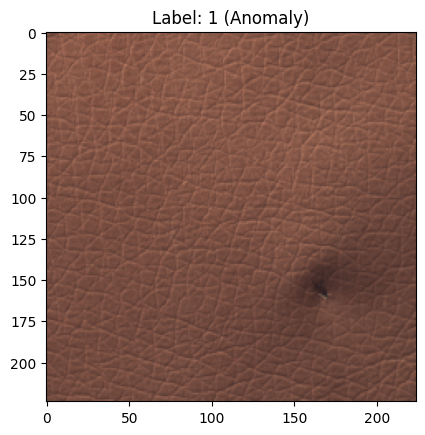

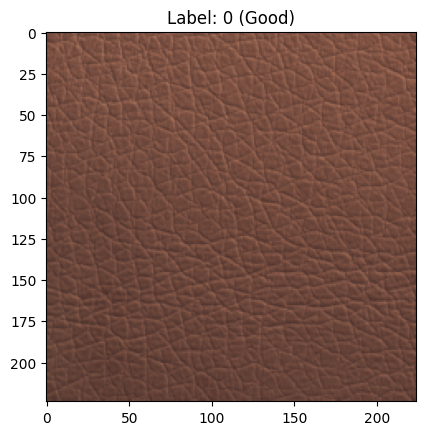

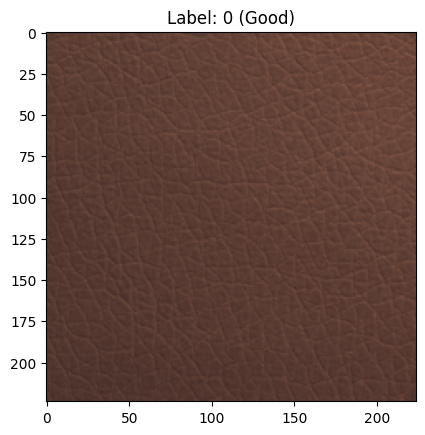

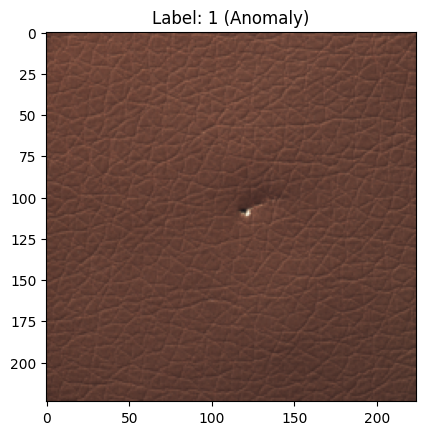

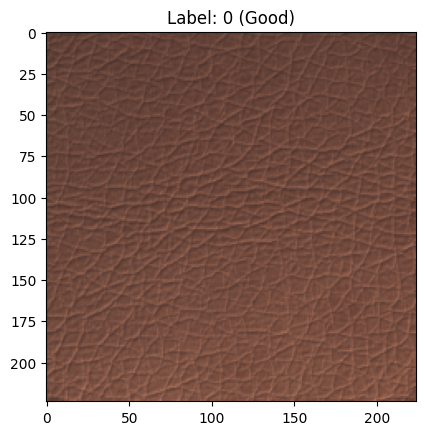

...

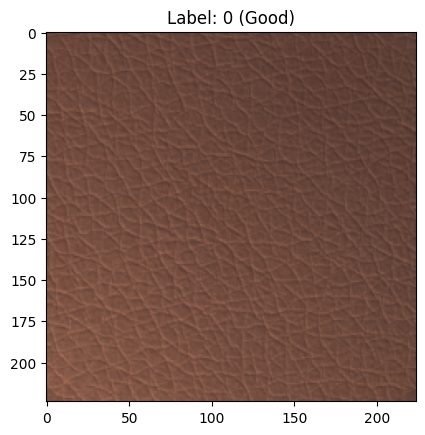

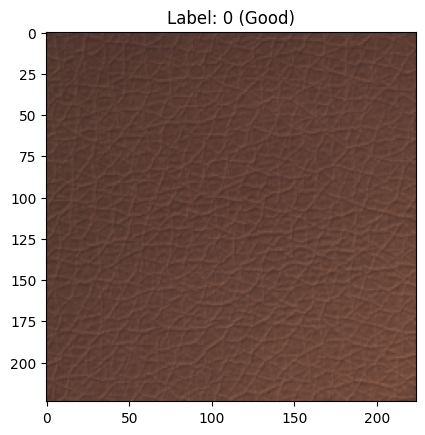

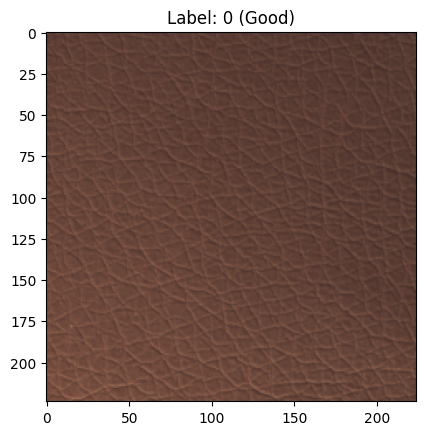

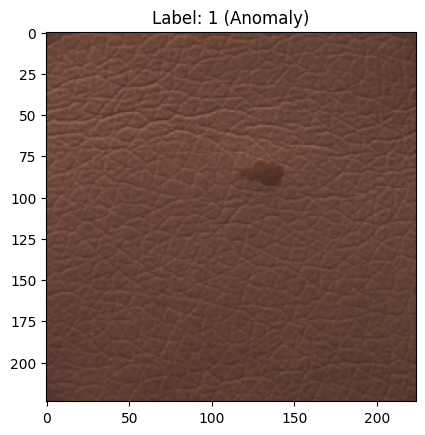

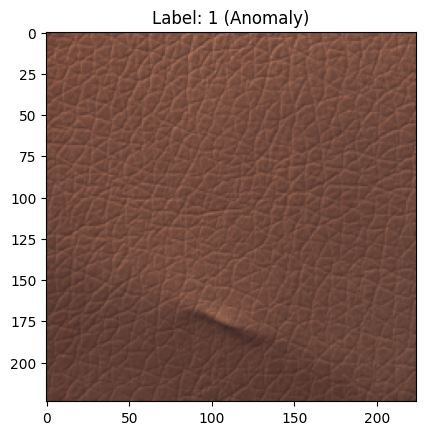

Length of a single batch of train dataset: 32


In [94]:
print(type(train_loader))
# Define label names
label_names = ["Good", "Anomaly"]


# To Visualize the images and labels or check the lengths of the train dataset
for images, labels in train_loader:
    # Visualize the images and labels
    for i in range(len(images)):
        image = images[i]
        label = labels[i]

        # Display or process the image and label as needed
        plt.imshow(image.permute(1, 2, 0))  # Assuming the image tensor is in CHW format
        plt.title(f"Label: {label} ({label_names[label]})")
        plt.show()

    # Check the length of the train dataset
    print(f"Length of a single batch of train dataset: {len(images)}")

    # Break the loop after the first batch if you only want to visualize the first batch
    break


## NN Models

# Customized Resnet34 models without Pruning

In [102]:
# Model without pruning techniques:
class CustomResNet34(nn.Module):

    def __init__(self, n_classes=2):
        super(CustomResNet34, self).__init__()

        # Using Pretrained ResNet34 and get rid of the last layer to add customised classification head
        resnet = models.resnet34(weights = True)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-2])

        self.classification_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=(1, 1)),
            nn.Flatten(),
            nn.Linear(in_features=resnet.fc.in_features, out_features=n_classes),
        )

        # To freeze some of the layers of the pretrained model
        self._freeze_params()


    def _freeze_params(self):
        # Number of layers to freeze
        freeze_layers = 95

        # Freeze parameters for the first freeze_layers layers
        for idx, param in enumerate(self.feature_extractor.parameters()):
            if idx < freeze_layers:
                param.requires_grad = False
            else:
                param.requires_grad = True

    def forward(self, x):
        feature_maps = self.feature_extractor(x)

        scores = self.classification_head(feature_maps)

        if self.training:
            return scores

        else:
            probs = nn.functional.softmax(scores, dim=-1)


            weights = self.classification_head[2].weight

            weights = (weights.unsqueeze(-1).unsqueeze(-1).unsqueeze(0).repeat((
                x.size(0),1,1,INPUT_IMG_SIZE[0] // 2**5,INPUT_IMG_SIZE[1] // 2**5,)))

            feature_maps = feature_maps.unsqueeze(1).repeat((1, probs.size(1), 1, 1, 1))
            location = torch.mul(weights, feature_maps).sum(axis=2)
            location = F.interpolate(location, size=INPUT_IMG_SIZE, mode="bilinear")

            maxs, _ = location.max(dim=-1, keepdim=True)
            maxs, _ = maxs.max(dim=-2, keepdim=True)
            mins, _ = location.min(dim=-1, keepdim=True)
            mins, _ = mins.min(dim=-2, keepdim=True)
            norm_location = (location - mins) / (maxs - mins)
            return probs, norm_location



In [103]:
from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomResNet34().to(device)
summary(model, (3, 224, 224))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [104]:
# Instantiate the custom model
model = CustomResNet34()
model.to(device)

class_weight = torch.tensor(class_weight).type(torch.FloatTensor).to(device)

# Define the loss function
criterion = nn.CrossEntropyLoss(weight=class_weight)
# Define the optimizer
optimizer = optim.Adam(model.parameters(), lr=lr)

<ipython-input-104-c8112a03516b>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  class_weight = torch.tensor(class_weight).type(torch.FloatTensor).to(device)




---

## Training and Evaluation of Model

---

### Model Training

In [105]:
# Training the model

def train(dataloader, model, optimizer, criterion, epochs, device, target_accuracy=None):
    """
    Script to train a model. Returns trained model.
    """
    model.to(device)
    model.train()

    for epoch in range(1, epochs + 1):
        print(f"Epoch {epoch}/{epochs}:", end=" ")
        running_loss = 0
        running_corrects = 0
        n_samples = 0

        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            preds_scores = model(inputs)
            # print(preds_scores.shape)
            # print(labels.shape)
            preds_class = torch.argmax(preds_scores, dim=-1)
            loss = criterion(preds_scores, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds_class == labels)
            n_samples += inputs.size(0)

        epoch_loss = running_loss / n_samples
        epoch_acc = running_corrects.double() / n_samples
        print("Loss = {:.4f}, Accuracy = {:.4f}".format(epoch_loss, epoch_acc))

        if target_accuracy != None:
            if epoch_acc > target_accuracy:
                print("Early Stopping")
                break

    return model

model = train(train_loader, model, optimizer, criterion, epochs, device, target_train_accuracy)

Epoch 1/20: Loss = 0.4035, Accuracy = 0.8125
Epoch 2/20: Loss = 0.1434, Accuracy = 0.9236
Epoch 3/20: Loss = 0.0762, Accuracy = 0.9792
Epoch 4/20: Loss = 0.0537, Accuracy = 0.9861
Epoch 5/20: Loss = 0.0416, Accuracy = 0.9896
Epoch 6/20: Loss = 0.0137, Accuracy = 1.0000
Early Stopping


In [106]:
# Saving the trained model:
model_path = f"/{subset_name}_model_d2.h5"
torch.save(model, model_path)

In [107]:
# Load the model
# model_path = f"/{subset_name}_model_d2.h5"
model = torch.load(model_path)

# Check if the model is loaded correctly
print(model)

CustomResNet34(
  (feature_extractor): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_ru

### Model Evaluation

In [108]:
def plot_confusion_matrix(y_true, y_pred, class_names="auto"):
    confusion = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=[5, 5])
    sns.heatmap(confusion, annot=True, cbar=False, xticklabels=class_names, yticklabels=class_names,)

    plt.ylabel("True labels")
    plt.xlabel("Predicted labels")
    plt.title("Confusion Matrix")
    plt.show()


def evaluate(model, dataloader, device):
    """
    Script to evaluate a model after training.
    Outputs accuracy and balanced accuracy, draws confusion matrix.
    """
    model.to(device)
    model.eval()
    class_names = dataloader.dataset.classes

    running_corrects = 0
    y_true = np.empty(shape=(0,))
    y_pred = np.empty(shape=(0,))

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        preds_probs, _ = model(inputs)
        preds_class = torch.argmax(preds_probs, dim=-1)

        labels = labels.to("cpu").numpy()
        preds_class = preds_class.detach().to("cpu").numpy()

        y_true = np.concatenate((y_true, labels))
        y_pred = np.concatenate((y_pred, preds_class))

    accuracy = accuracy_score(y_true, y_pred)
    balanced_accuracy = balanced_accuracy_score(y_true, y_pred)

    print("Accuracy: {:.4f}".format(accuracy))
    print("Balanced Accuracy: {:.4f}".format(balanced_accuracy))
    print()
    plot_confusion_matrix(y_true, y_pred, class_names=class_names)


Accuracy: 0.9730
Balanced Accuracy: 0.9818



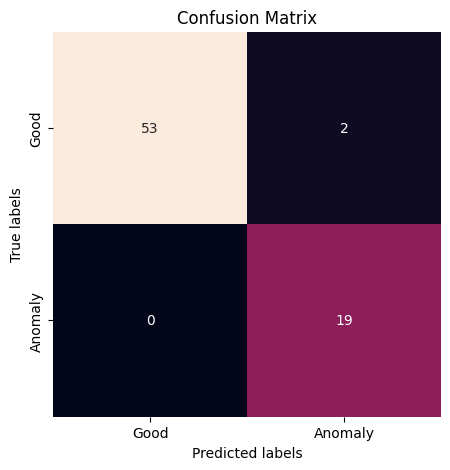

In [109]:
# Calling the Evaluate model function:
evaluate(model, test_loader, device)



---

### **Model Inference and Visualisation**

---



### Visualize and infer


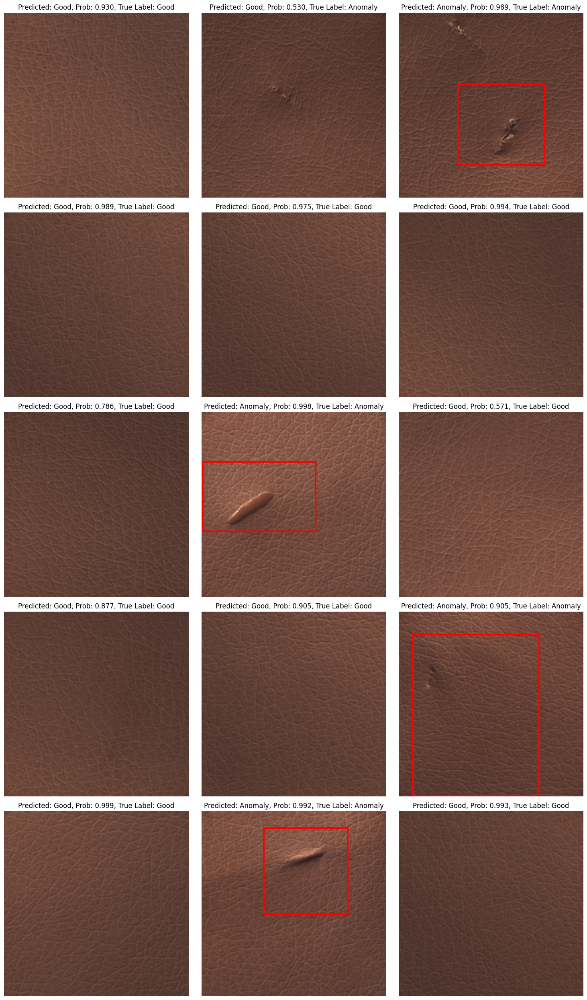

In [110]:

def get_bbox_from_heatmap_2(heatmap, thres=0.8):
    """
    Returns bounding box around the defected area:
    Upper left and lower right corner.

    Threshold affects size of the bounding box.
    The higher the threshold, the wider the bounding box.
    """
    binary_map = heatmap > thres

    x_dim = np.max(binary_map, axis=0) * np.arange(0, binary_map.shape[1])
    x_0 = int(x_dim[x_dim > 0].min())
    x_1 = int(x_dim.max())

    y_dim = np.max(binary_map, axis=1) * np.arange(0, binary_map.shape[0])
    y_0 = int(y_dim[y_dim > 0].min())
    y_1 = int(y_dim.max())

    return x_0, y_0, x_1, y_1


def predict_localize(model, dataloader, device, thres=0.4, n_samples=9, show_heatmap=False):
    """
    Runs predictions for the samples in the dataloader.
    Shows image, its true label, predicted label and probability.
    If an anomaly is predicted, draws bbox around defected region and heatmap.
    """
    model.to(device)
    model.eval()

    class_names = dataloader.dataset.classes
    transform_to_PIL = transforms.ToPILImage()

    n_cols = 3
    n_rows = int(np.ceil(n_samples / n_cols))
    plt.figure(figsize=[n_cols * 5, n_rows * 5])

    counter = 0
    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        out = model(inputs)
        probs, class_preds = torch.max(out[0], dim=-1)
        feature_maps = out[1].to("cpu")

        for img_i in range(inputs.size(0)):
            img = transform_to_PIL(inputs[img_i])
            class_pred = class_preds[img_i]
            prob = probs[img_i]
            label = labels[img_i]
            heatmap = feature_maps[img_i][NEG_CLASS].detach().numpy()

            counter += 1
            plt.subplot(n_rows, n_cols, counter)
            plt.imshow(img)
            plt.axis("off")
            plt.title(
                "Predicted: {}, Prob: {:.3f}, True Label: {}".format(
                    class_names[class_pred], prob, class_names[label]
                )
            )

            if class_pred == NEG_CLASS:
                x_0, y_0, x_1, y_1 = get_bbox_from_heatmap_2(heatmap, thres)
                rectangle = Rectangle(
                    (x_0, y_0),
                    x_1 - x_0,
                    y_1 - y_0,
                    edgecolor="red",
                    facecolor="none",
                    lw=3,
                )
                plt.gca().add_patch(rectangle)
                if show_heatmap:
                    plt.imshow(heatmap, cmap="Reds", alpha=0.3)

            if counter == n_samples:
                plt.tight_layout()
                plt.show()
                return


# Calling predict_localize function
predict_localize(model, test_loader, device, thres=0.6, n_samples=15, show_heatmap=False)


# CustomRenet34 Model with Pruning  

In [132]:

class CustomResNet34_prune(nn.Module):
    """
    Custom multi-class classification model
    with ResNet34 feature extractor, pretrained on ImageNet
    and custom classification head.
    Parameters for the first convolutional blocks are freezed.

    Returns class scores when in train mode.
    Returns class probs and normalized feature maps when in eval mode.
    """

    def __init__(self, n_classes=2):
        super(CustomResNet34_prune, self).__init__()

        # Using Pretrained ResNet34 and get rid of the last layer to add customised classification head
        resnet = models.resnet34(weights = True)
        self.feature_extractor = nn.Sequential(*list(resnet.children())[:-2])

        self.classification_head = nn.Sequential(
            nn.AdaptiveAvgPool2d(output_size=(1, 1)),
            nn.Flatten(),
            nn.Linear(in_features=resnet.fc.in_features, out_features=n_classes),
        )

        # To freeze some of the layers of the pretrained model
        self._freeze_params()


    def _freeze_params(self):
        # Number of layers to freeze
        freeze_layers = 100

        # Freeze parameters for the first freeze_layers layers
        for idx, param in enumerate(self.feature_extractor.parameters()):
            if idx < freeze_layers:
                param.requires_grad = False
            else:
                param.requires_grad = True

    def forward(self, x):
        feature_maps = self.feature_extractor(x)

        scores = self.classification_head(feature_maps)

        if self.training:
            return scores

        else:
            probs = nn.functional.softmax(scores, dim=-1)


            weights = self.classification_head[2].weight

            weights = (weights.unsqueeze(-1).unsqueeze(-1).unsqueeze(0).repeat((
                x.size(0),1,1,INPUT_IMG_SIZE[0] // 2**5,INPUT_IMG_SIZE[1] // 2**5,)))

            feature_maps = feature_maps.unsqueeze(1).repeat((1, probs.size(1), 1, 1, 1))
            location = torch.mul(weights, feature_maps).sum(axis=2)
            location = F.interpolate(location, size=INPUT_IMG_SIZE, mode="bilinear")

            maxs, _ = location.max(dim=-1, keepdim=True)
            maxs, _ = maxs.max(dim=-2, keepdim=True)
            mins, _ = location.min(dim=-1, keepdim=True)
            mins, _ = mins.min(dim=-2, keepdim=True)
            norm_location = (location - mins) / (maxs - mins)
            return probs, norm_location

    def prune(self, pruning_rate):
      # Apply magnitude-based pruning with thresholding
      parameters_to_prune = [(self.classification_head[2], 'weight')]

      prune.global_unstructured(parameters_to_prune, pruning_method=prune.L1Unstructured, amount=pruning_rate,)


**Visualizing Model Architecture**

In [133]:
from torchsummary import summary

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = CustomResNet34_prune().to(device)
summary(model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

In [134]:
# Instantiate the custom model
model = CustomResNet34_prune()
model.to(device)

# Prune the model with a desired pruning rate
pruning_rate = 0.05  # Example pruning rate of 10%
model.prune(pruning_rate)
# Save the pruned model
torch.save(model, "pruned_model.pth")


class_weight = torch.tensor(class_weight).type(torch.FloatTensor).to(device)

# Define the loss function
criterion = nn.CrossEntropyLoss(weight=class_weight)
# Define the optimizer
optimizer = optim.Adam(model.parameters(), lr=lr)

<ipython-input-134-073a06557c97>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  class_weight = torch.tensor(class_weight).type(torch.FloatTensor).to(device)


In [135]:
# model_path = f"/{subset_name}_model_d2.h5"
model = torch.load('pruned_model.pth')




---

### **Pruning Model Training and Evaluation**

---

**Model Training**

In [136]:
# Training the model

def train(dataloader, model, optimizer, criterion, epochs, device, target_accuracy=None):
    """
    Script to train a model. Returns trained model.
    """
    model.to(device)
    model.train()

    for epoch in range(1, epochs + 1):
        print(f"Epoch {epoch}/{epochs}:", end=" ")
        running_loss = 0
        running_corrects = 0
        n_samples = 0

        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            preds_scores = model(inputs)
            # print(preds_scores.shape)
            # print(labels.shape)
            preds_class = torch.argmax(preds_scores, dim=-1)
            loss = criterion(preds_scores, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds_class == labels)
            n_samples += inputs.size(0)

        epoch_loss = running_loss / n_samples
        epoch_acc = running_corrects.double() / n_samples
        print("Loss = {:.4f}, Accuracy = {:.4f}".format(epoch_loss, epoch_acc))

        if target_accuracy != None:
            if epoch_acc > target_accuracy:
                print("Early Stopping")
                break

    return model

model = train(train_loader, model, optimizer, criterion, epochs, device, target_train_accuracy)

Epoch 1/20: Loss = 0.9041, Accuracy = 0.2500
Epoch 2/20: Loss = 0.9008, Accuracy = 0.2535
Epoch 3/20: Loss = 0.8997, Accuracy = 0.2431
Epoch 4/20: Loss = 0.9236, Accuracy = 0.2465
Epoch 5/20: Loss = 0.8911, Accuracy = 0.2535
Epoch 6/20: Loss = 0.9205, Accuracy = 0.2500
Epoch 7/20: Loss = 0.9134, Accuracy = 0.2500
Epoch 8/20: Loss = 0.8857, Accuracy = 0.2500
Epoch 9/20: Loss = 0.9246, Accuracy = 0.2500
Epoch 10/20: Loss = 0.9078, Accuracy = 0.2604
Epoch 11/20: Loss = 0.8986, Accuracy = 0.2535
Epoch 12/20: Loss = 0.8672, Accuracy = 0.2465
Epoch 13/20: Loss = 0.9088, Accuracy = 0.2500
Epoch 14/20: Loss = 0.8996, Accuracy = 0.2535
Epoch 15/20: Loss = 0.9049, Accuracy = 0.2500
Epoch 16/20: Loss = 0.8775, Accuracy = 0.2500
Epoch 17/20: Loss = 0.9057, Accuracy = 0.2465
Epoch 18/20: Loss = 0.8950, Accuracy = 0.2569
Epoch 19/20: Loss = 0.8888, Accuracy = 0.2639
Epoch 20/20: Loss = 0.9068, Accuracy = 0.2431


### **Pruning Model evaluation**

Accuracy: 0.2568
Balanced Accuracy: 0.5000



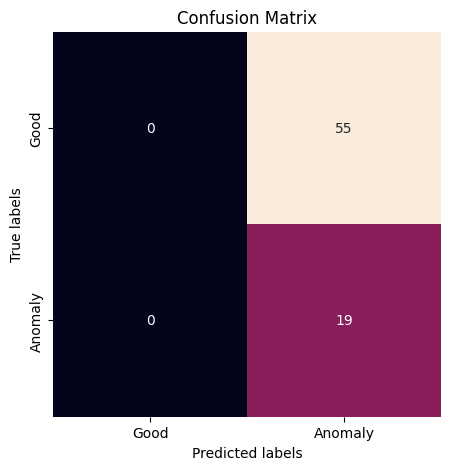

In [137]:
def plot_confusion_matrix(y_true, y_pred, class_names="auto"):
    confusion = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=[5, 5])
    sns.heatmap(confusion, annot=True, cbar=False, xticklabels=class_names, yticklabels=class_names,)

    plt.ylabel("True labels")
    plt.xlabel("Predicted labels")
    plt.title("Confusion Matrix")
    plt.show()


def evaluate(model, dataloader, device):
    """
    Script to evaluate a model after training.
    Outputs accuracy and balanced accuracy, draws confusion matrix.
    """
    model.to(device)
    model.eval()
    class_names = dataloader.dataset.classes

    running_corrects = 0
    y_true = np.empty(shape=(0,))
    y_pred = np.empty(shape=(0,))

    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        preds_probs, _ = model(inputs)
        preds_class = torch.argmax(preds_probs, dim=-1)

        labels = labels.to("cpu").numpy()
        preds_class = preds_class.detach().to("cpu").numpy()

        y_true = np.concatenate((y_true, labels))
        y_pred = np.concatenate((y_pred, preds_class))

    accuracy = accuracy_score(y_true, y_pred)
    balanced_accuracy = balanced_accuracy_score(y_true, y_pred)

    print("Accuracy: {:.4f}".format(accuracy))
    print("Balanced Accuracy: {:.4f}".format(balanced_accuracy))
    print()
    plot_confusion_matrix(y_true, y_pred, class_names=class_names)

# Calling the Evaluate model function:
evaluate(model, test_loader, device)

### **Pruned Model Inference and Visualization**

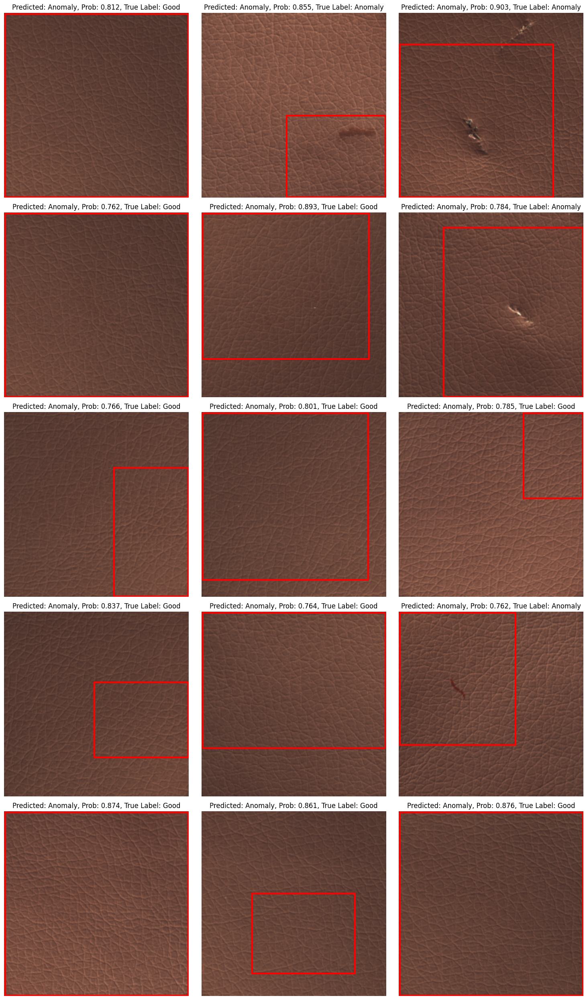

In [139]:

def get_bbox_from_heatmap_2(heatmap, thres=0.8):
    """
    Returns bounding box around the defected area:
    Upper left and lower right corner.

    Threshold affects size of the bounding box.
    The higher the threshold, the wider the bounding box.
    """
    binary_map = heatmap > thres

    x_dim = np.max(binary_map, axis=0) * np.arange(0, binary_map.shape[1])
    x_0 = int(x_dim[x_dim > 0].min())
    x_1 = int(x_dim.max())

    y_dim = np.max(binary_map, axis=1) * np.arange(0, binary_map.shape[0])
    y_0 = int(y_dim[y_dim > 0].min())
    y_1 = int(y_dim.max())

    return x_0, y_0, x_1, y_1


def predict_localize(model, dataloader, device, thres=0.4, n_samples=9, show_heatmap=False):
    """
    Runs predictions for the samples in the dataloader.
    Shows image, its true label, predicted label and probability.
    If an anomaly is predicted, draws bbox around defected region and heatmap.
    """
    model.to(device)
    model.eval()

    class_names = dataloader.dataset.classes
    transform_to_PIL = transforms.ToPILImage()

    n_cols = 3
    n_rows = int(np.ceil(n_samples / n_cols))
    plt.figure(figsize=[n_cols * 5, n_rows * 5])

    counter = 0
    for inputs, labels in dataloader:
        inputs = inputs.to(device)
        out = model(inputs)
        probs, class_preds = torch.max(out[0], dim=-1)
        feature_maps = out[1].to("cpu")

        for img_i in range(inputs.size(0)):
            img = transform_to_PIL(inputs[img_i])
            class_pred = class_preds[img_i]
            prob = probs[img_i]
            label = labels[img_i]
            heatmap = feature_maps[img_i][NEG_CLASS].detach().numpy()

            counter += 1
            plt.subplot(n_rows, n_cols, counter)
            plt.imshow(img)
            plt.axis("off")
            plt.title(
                "Predicted: {}, Prob: {:.3f}, True Label: {}".format(
                    class_names[class_pred], prob, class_names[label]
                )
            )

            if class_pred == NEG_CLASS:
                x_0, y_0, x_1, y_1 = get_bbox_from_heatmap_2(heatmap, thres)
                rectangle = Rectangle(
                    (x_0, y_0),
                    x_1 - x_0,
                    y_1 - y_0,
                    edgecolor="red",
                    facecolor="none",
                    lw=3,
                )
                plt.gca().add_patch(rectangle)
                if show_heatmap:
                    plt.imshow(heatmap, cmap="Reds", alpha=0.3)

            if counter == n_samples:
                plt.tight_layout()
                plt.show()
                return


# Calling predict_localize function
predict_localize(model, test_loader, device, thres=0.6, n_samples=15, show_heatmap=False)
